<a href="https://colab.research.google.com/github/ivaaanrm/AI-Earth-Observation/blob/main/load_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dataset Preparation

Notebook created by [Herrera-Giménez, Marc](https://www.linkedin.com/in/marc-herrera/) and [Alonso-González, Alberto](https://www.linkedin.com/in/alberto-alonso-gonz%C3%A1lez-b9b07684/) for the Artificial Intelligence and Big Data for Earth Observation Course [AI4EO](https://www.upc.edu/content/grau/guiadocent/pdf/ang/230743) in the [ETSETB UPC](https://telecos.upc.edu/ca) (2025).


<hr>

## Introduction

This notebook is an example on how to load and visualise data from different sources into one single dataset.


We will start by importing and installing the necessary libraries to work with this data

In [31]:
if False:
  !pip install rasterio
  !pip install rioxarray

import rasterio
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import xarray as xr
import rioxarray as rxa
from google.colab import drive

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import re
from glob import glob

from typing import Any, Dict

### Utils

In [32]:
def plot_data(data, title="", colorbar=False, **kwargs):
    """
    Plot some specific data
    """
    plt.figure(figsize=(12,6))
    img = plt.imshow(data, **kwargs)
    plt.title(title)
    if colorbar:
        plt.colorbar(img)
    plt.tight_layout()
    plt.show()

def plot_images(images, title="Images", titles=None, colorbar=False, **kwargs):
    """
    Plots multiple images with a maximum of 3 images per row.

    :param images: List of images (NumPy arrays) to plot.
    :param titles: List of titles for each image (default: None).
    :param colorbar: Whether to display a colorbar (default: False).
    :param **kwargs: Additional arguments for `imshow()`.
    """
    num_images = len(images)
    titles = titles or [f"Image {i+1}" for i in range(num_images)]

    cols = min(3, num_images)  # Maximum 3 images per row
    rows = (num_images + 2) // 3  # Compute rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    fig.suptitle(title)
    axes = np.array(axes).reshape(rows, cols)  # Ensure correct shape

    for ax, img, title in zip(axes.flat, images, titles):
        img_display = ax.imshow(img, **kwargs)
        ax.set_title(title)
        ax.axis("off")

        if colorbar:
            plt.colorbar(img_display, ax=ax, fraction=0.046, pad=0.04)

    # Hide unused axes if any
    for i in range(num_images, rows * cols):
        fig.delaxes(axes.flat[i])

    plt.tight_layout()
    plt.show()

In [4]:
class ImageProcessing():
    def __init__(self) -> None:
        pass

    @staticmethod
    def adjust_dynamic_range(image: np.ndarray, percentile: float = 98) -> np.ndarray:
        """
        Adjusts the dynamic range of an RGB image using a given percentile.

        :param image: Input RGB image as a NumPy array.
        :param percentile: Percentile value for normalization (default is 98).
        :return: Adjusted RGB image with values clipped between 0 and 1.
        """
        scale = np.nanpercentile(image, percentile)
        image = image / scale
        return np.clip(image, 0, 1)

## Data

Three data sources for a common area will be combined. Two Sentinel-1 satellites acquisitions, two Sentinel-2 satellites acquisitions and one Land Cover map.

The three datasets have been previously coregistered to be on the same spatial grid. They are provided in NetCDF format.

The data is uploaded and available in the user Google Drive, we will mount into the Colab the work space and the specific folder.

In [5]:
BASE_PROJECT = "/content/drive/MyDrive/AI4EO"
RAW_DATA_FOLDER = os.path.join(BASE_PROJECT, "raw-data")

## 1. Load and display the Sentinel-2 image

The first step is to load and visualize the Sentinel-2 data, in order to better understand the file structure. Sentinel-2 carries a single `Multi-spectral Instrument (MSI)`, which provides 13 bands in the `visible`, `near-infrared` and `shortwave-infrared` spectrum with different ground resolutions:

|#|Name|Spatial Resolution|
|------------|----------------|-----------------|
|B1|Coastal aerosol|60|
|B2|Blue|10|
|B3|Green|10|
|B4|Red|10|
|B5|Red Edge 1|20|
|B6|Red Edge 2|20|
|B7|Red Edge 3|20|
|B8|Near-Infrared|10|
|B8a|Near-Infrared narrow|20|
|B9|Water vapor|60|
|B10|Shortwave-Infrared cirrus|60|
|B11|Shortwave Infrared 1|20|
|B12|Shortwave-Infrared 2|20|

In the provided file, however, all the bands have been upsampled to the same resolution (10m), for simplicity.

To load the data we can use the `load_dataset` [function](https://docs.xarray.dev/en/stable/generated/xarray.load_dataset.html) from xarray.

In [41]:
class Dataset():
    def __init__(self, path_data: str) -> None:
        self.path = path_data
        try:
            self.data: xr.Dataset = self.__load_dataset(path_data)
        except Exception as e:
            raise Exception(f"Error loading dataset: {e}")

    def __call__(self, *args: Any, **kwds: Any) -> xr.Dataset:
        return self.data

    def __repr__(self) -> str:
        return f"{self.data}"

    def __load_dataset(self, path: str) -> xr.Dataset:
        return xr.load_dataset(path)


class Sentinel1(Dataset):
    def __init__(self, path_data: str) -> None:
        self.name = "Sentinel-1"
        super().__init__(path_data)

    @property
    def amplitude_vv(self):
        """Amplitude of VV polarization"""
        return 10 * np.log10(self.data.Amplitude_VV.values)

    @property
    def amplitude_vh(self):
        """Amplitude of VH polarization"""
        return 10 * np.log10(self.data.Amplitude_VH.values)

    @property
    def vh_vv_ratio(self):
        """VH/VV Ratio"""
        return self.data.Amplitude_VH.values / np.where(self.data.Amplitude_VV.values == 0, np.nan, self.data.Amplitude_VV.values)

    @property
    def sigma_nought_vv(self):
        """Sigma Nought (σ⁰) for VV polarization"""
        return 10 * np.log10(np.square(self.data.Amplitude_VV.values))

    @property
    def sigma_nought_vh(self):
        """Sigma Nought (σ⁰) for VH polarization"""
        return 10 * np.log10(np.square(self.data.Amplitude_VH.values))

    @property
    def rvi(self):
        """Radar Vegetation Index (RVI)"""
        vv = self.data.Amplitude_VV.values
        vh = self.data.Amplitude_VH.values
        return (4 * vh) / np.where(vv + vh == 0, np.nan, vv + vh)

    @property
    def rwi(self):
        """Radar Water Index (RWI)"""
        vv = self.data.Amplitude_VV.values
        vh = self.data.Amplitude_VH.values
        return (vv - vh) / np.where(vv + vh == 0, np.nan, vv + vh)

    @property
    def mpdi(self):
        """Microwave Polarization Difference Index (MPDI)"""
        vv = self.data.Amplitude_VV.values
        vh = self.data.Amplitude_VH.values
        return (vv - vh) / np.where(vv + vh == 0, np.nan, vv + vh)

    @property
    def rgb_sar(self):
        """Compute RGB SAR composite using VV, VH, and VH/VV ratio."""
        try:
            red = self.data.Amplitude_VV.values  # VV polarization
            green = self.data.Amplitude_VH.values  # VH polarization
            blue = self.vh_vv_ratio  # VH/VV ratio

            # Stack into an RGB composite
            rgb = np.dstack((red, green, blue))

            # Normalize using mean-based scaling
            rgb /= 2.5 * np.nanmean(rgb, axis=(0, 1))

            # Clip values between 0 and 1
            rgb = np.clip(rgb, 0, 1)

            return rgb
        except KeyError as e:
            raise KeyError(f"Missing required Sentinel-1 bands: {e}")


class Sentinel2(Dataset):
    def __init__(self, path_data: str) -> None:
        self.name = "Sentinel-2"
        super().__init__(path_data)

    @property
    def rgb_image(self):
        try:
            # Slice first before stacking
            red_band = self.data.B4.values
            green_band = self.data.B3.values
            blue_band = self.data.B2.values

            # Clip NaN values or replace them with 0 (optional)
            red_band = np.clip(red_band, 0, 1)
            green_band = np.clip(green_band, 0, 1)
            blue_band = np.clip(blue_band, 0, 1)

            # Stack the bands to create the RGB image
            rgb_image = np.stack([red_band, green_band, blue_band], axis=-1)

            return rgb_image
        except KeyError as e:
            raise KeyError(f"Missing one or more required bands: {e}")

    def _compute_index(self, band1, band2):
        """Helper function to compute a normalized difference index."""
        band1 = band1.astype(np.float32)
        band2 = band2.astype(np.float32)
        return (band1 - band2) / np.where((band1 + band2) == 0, 1, (band1 + band2))

    @property
    def ndvi_image(self):
        """Normalized Difference Vegetation Index (NDVI)"""
        return self._compute_index(self.data.B8.values, self.data.B4.values)

    @property
    def ndwi_image(self):
        """Normalized Difference Water Index (NDWI)"""
        return self._compute_index(self.data.B3.values, self.data.B8.values)

    @property
    def ndbi_image(self):
        """Normalized Difference Built-Up Index (NDBI)"""
        return self._compute_index(self.data.B11.values, self.data.B8.values)

    @property
    def ndsi_image(self):
        """Normalized Difference Snow Index (NDSI)"""
        return self._compute_index(self.data.B3.values, self.data.B11.values)

    @property
    def ndsi2_image(self):
        """Normalized Difference Snow Index (NDSI)"""
        return self._compute_index(self.data.B11.values, self.data.B12.values)

    @property
    def nbr_image(self):
        """Normalized Burn Ratio (NBR)"""
        return self._compute_index(self.data.B8.values, self.data.B12.values)

    @property
    def awei_image(self):
        """Automated Water Extraction Index (AWEI)"""
        green = self.data.B3.values.astype(np.float32)
        nir = self.data.B8.values.astype(np.float32)
        swir1 = self.data.B11.values.astype(np.float32)
        swir2 = self.data.B12.values.astype(np.float32)

        return 4 * (green - swir1) - (0.25 * nir + 2.75 * swir2)


class LandCover():
    """
    Class to handle and visualize ESA WorldCover 10m land cover data.
    """

    # ESA WorldCover classification system
    land_cover_classes = {
        10: "Trees",
        20: "Shrubland",
        30: "Grassland",
        40: "Cropland",
        50: "Built-up",
        60: "Bare/Sparse Vegetation",
        70: "Snow & Ice",
        80: "Permanent Water Bodies",
        90: "Herbaceous Wetland",
        95: "Mangroves",
        100: "Moss & Lichen",
    }

    # Corresponding colors for visualization
    land_cover_colors = {
        10: "#006400",  # Dark Green - Trees
        20: "#ffbb22",  # Light Brown - Shrubland
        30: "#ffff4c",  # Yellow - Grassland
        40: "#f096ff",  # Purple - Cropland
        50: "#fa0000",  # Red - Built-up
        60: "#b4b4b4",  # Gray - Bare/Sparse Vegetation
        70: "#f0f0f0",  # White - Snow & Ice
        80: "#0064c8",  # Blue - Water Bodies
        90: "#0096a0",  # Teal - Herbaceous Wetland
        95: "#00cf75",  # Green-Teal - Mangroves
        100: "#fae6a0",  # Light Yellow - Moss & Lichen
    }

    def __init__(self, file_path: str):
        """
        Initializes the LandCover class by loading the raster dataset.

        :param file_path: Path to the ESA WorldCover raster file.
        """
        self.file_path = file_path

        # Load the raster dataset
        with rasterio.open(file_path) as src:
            self.data = src.read(1)  # Read the first (only) band
            self.meta = src.meta  # Store metadata

        # Get unique land cover classes in the dataset
        self.unique_classes = np.unique(self.data)
        self.unique_classes = self.unique_classes[self.unique_classes != 0]  # Remove background (0) if present

    def plot(self, title="ESA WorldCover Land Cover", figsize=(10, 6)):
        """
        Plots the land cover map using the correct color coding.

        :param title: Title of the plot.
        :param figsize: Figure size for the plot.
        """
        # Create a colormap for only the present classes
        class_ids = [cls for cls in self.unique_classes if cls in self.land_cover_classes]
        colors = [self.land_cover_colors[cls] for cls in class_ids]

        cmap = ListedColormap(colors)

        # Plot the land cover map
        plt.figure(figsize=figsize)
        plt.imshow(self.data, cmap=cmap)
        plt.colorbar(label="Land Cover Class")
        plt.title(title)
        plt.show()

    def get_class_distribution(self):
        """
        Returns a dictionary with the count of pixels per land cover class.
        """
        class_counts = {cls: np.sum(self.data == cls) for cls in self.unique_classes}
        return {self.land_cover_classes.get(cls, "Unknown"): count for cls, count in class_counts.items()}

### Plot dataset

In [14]:
S2_20230420 = Sentinel2(os.path.join(RAW_DATA_FOLDER, "S2_20230420.nc"))
print(S2_20230420)

<xarray.Dataset> Size: 4GB
Dimensions:                                  (lat: 2146, lon: 2548)
Coordinates:
  * lat                                      (lat) float64 17kB 41.43 ... 41.23
  * lon                                      (lon) float64 20kB 1.601 ... 1.829
Data variables: (12/423)
    metadata                                 int8 1B -127
    B1                                       (lat, lon) float32 22MB nan ... nan
    B2                                       (lat, lon) float32 22MB nan ... nan
    B3                                       (lat, lon) float32 22MB nan ... nan
    B4                                       (lat, lon) float32 22MB nan ... nan
    B5                                       (lat, lon) float32 22MB nan ... nan
    ...                                       ...
    scl_water_mask                           int8 1B -127
    scl_unclassified_mask                    int8 1B -127
    scl_cloud_medium_proba_mask              int8 1B -127
    scl_cloud_high_p

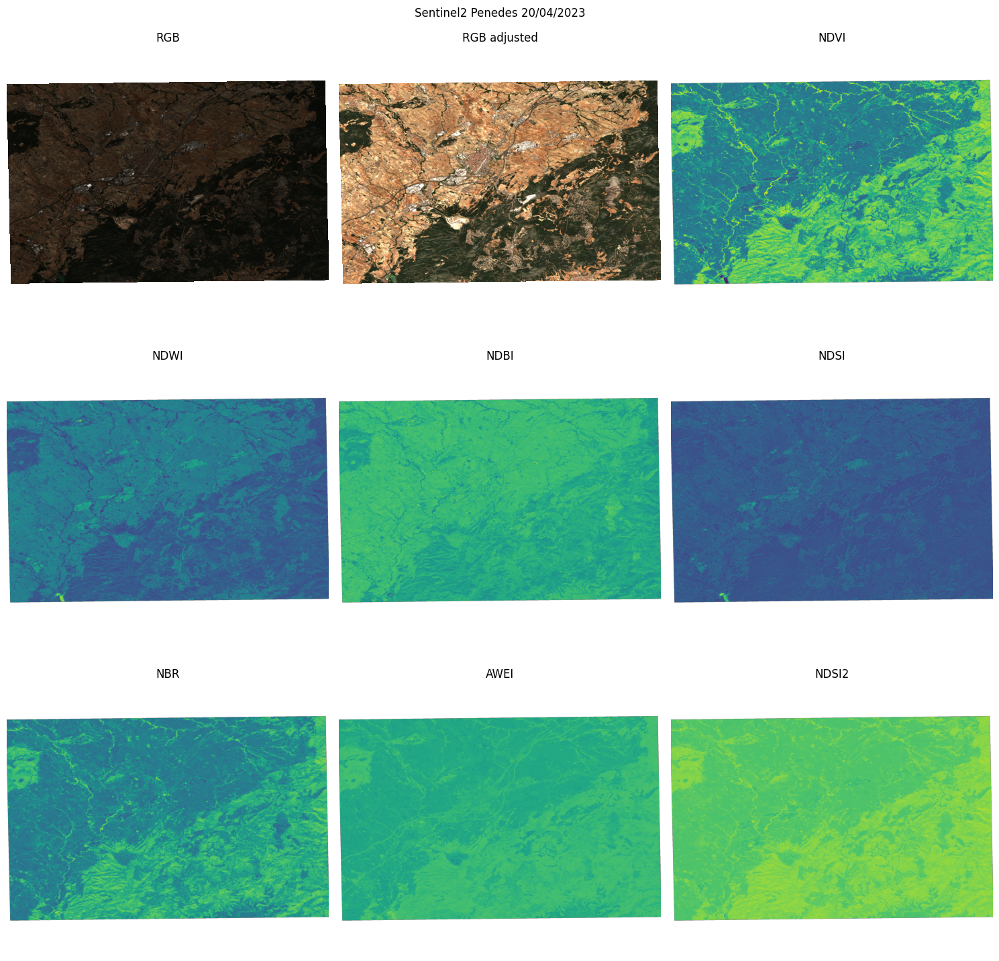

In [15]:
plot_images(
    images=[S2_20230420.rgb_image, ImageProcessing.adjust_dynamic_range(S2_20230420.rgb_image), S2_20230420.ndvi_image,
            S2_20230420.ndwi_image, S2_20230420.ndbi_image, S2_20230420.ndsi_image, S2_20230420.nbr_image, S2_20230420.awei_image, S2_20230420.ndsi2_image],
    title="Sentinel2 Penedes 20/04/2023",
    titles=["RGB", "RGB adjusted", "NDVI", "NDWI", "NDBI", "NDSI", "NBR", "AWEI", "NDSI2"],
)

In [9]:
S2_20230624 = Sentinel2(os.path.join(RAW_DATA_FOLDER, "S2_20230624.nc"))

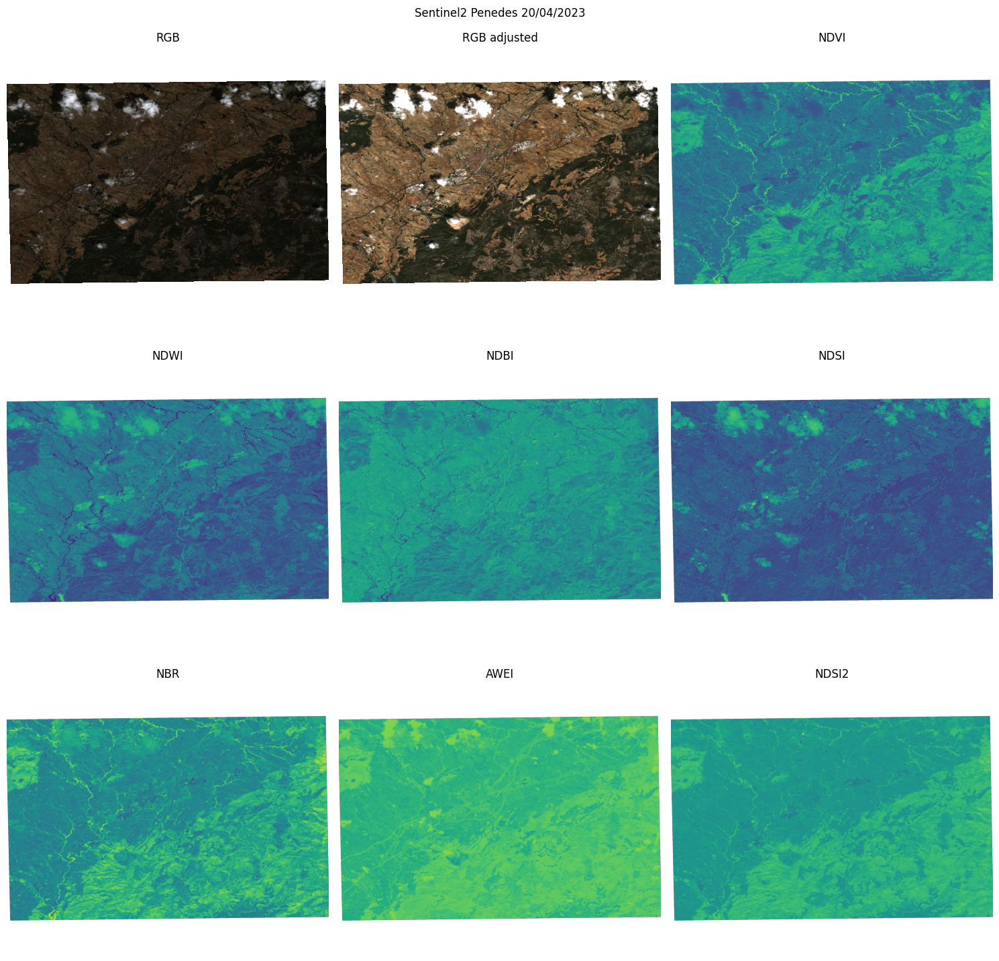

In [10]:
plot_images(
    images=[S2_20230624.rgb_image, ImageProcessing.adjust_dynamic_range(S2_20230624.rgb_image), S2_20230624.ndvi_image,
            S2_20230624.ndwi_image, S2_20230624.ndbi_image, S2_20230624.ndsi_image, S2_20230624.nbr_image, S2_20230624.awei_image, S2_20230624.ndsi2_image],
    title="Sentinel2 Penedes 20/04/2023",
    titles=["RGB", "RGB adjusted", "NDVI", "NDWI", "NDBI", "NDSI", "NBR", "AWEI", "NDSI2"],
)

To inspect the dataset, we can simply use the [`plot()`](https://docs.xarray.dev/en/stable/generated/xarray.plot.plot.html) function from xarray.


Since Sentinel-2 has the Red, Green and Blue channels we can generate an RGB image by forming an image.
For this we need to generate an array with a shape `(rows, cols, 3)`, where the last 3 channels correspond to the RGB.
We can use [`np.dstack`](https://numpy.org/doc/stable/reference/generated/numpy.dstack.html) for this.

In order to reduce the dynamic range shown, instead of clipping between 0 and 1 from the original input data, we will first normalize it between 0 and the 98% percentile (to exclude the 2% with higher values).

Tip: you can use [`np.nanpercentile`](https://numpy.org/doc/stable/reference/generated/numpy.nanpercentile.html) to avoid problems with invalid values, marked as `nan`.



---



## 2. Load and display the Sentinel-1 image

The Sentinel-1 image is a dual-pol SAR data, containing the polarizations VV and VH. It corresponds to a GRD product projected to the same grid as the Sentinel-2 data previously seen.
The included bands contain the amplitude in VV and VH polarizations into the `Amplitude_VV` and `Amplitude_VH` bands.

Tip: To visualize this data is easier to show their values in dB (10*np.log10(Amplitude)) due to the large dynamic range of SAR data.

In [24]:
S1_20230418 = Sentinel1(os.path.join(RAW_DATA_FOLDER, "S1_20230418.nc"))
print(S1_20230418)

<xarray.Dataset> Size: 88MB
Dimensions:       (lat: 2146, lon: 2548)
Coordinates:
  * lat           (lat) float64 17kB 41.43 41.43 41.43 ... 41.23 41.23 41.23
  * lon           (lon) float64 20kB 1.601 1.601 1.601 ... 1.829 1.829 1.829
Data variables:
    metadata      int8 1B -127
    Amplitude_VH  (lat, lon) float32 22MB nan nan nan nan ... nan nan nan nan
    Amplitude_VV  (lat, lon) float32 22MB nan nan nan nan ... nan nan nan nan
    latitude      (lat, lon) float32 22MB nan nan nan nan ... nan nan nan nan
    longitude     (lat, lon) float32 22MB nan nan nan nan ... nan nan nan nan
    crs           int32 4B -2147483647
Attributes:
    Conventions:       CF-1.4
    TileSize:          537:637
    product_type:      Derived from (GRD)
    metadata_profile:  beam
    metadata_version:  0.5
    start_date:        18-APR-2023 17:47:14.398455
    stop_date:         18-APR-2023 17:47:17.158869
    title:             Sentinel-1 IW Level-1 GRD Product


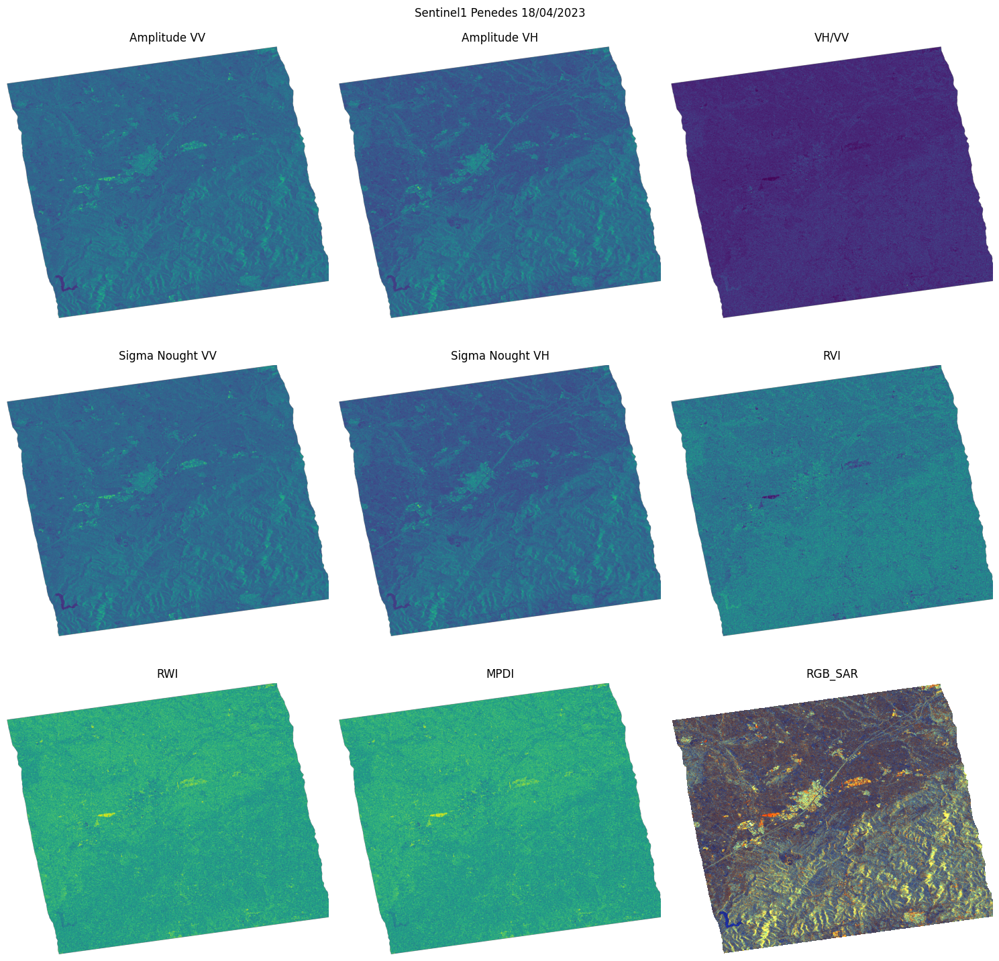

In [25]:
plot_images(
    images=[S1_20230418.amplitude_vv, S1_20230418.amplitude_vh, S1_20230418.vh_vv_ratio, S1_20230418.sigma_nought_vv, S1_20230418.sigma_nought_vh, S1_20230418.rvi, S1_20230418.rwi, S1_20230418.mpdi, S1_20230418.rgb_sar],
    title="Sentinel1 Penedes 18/04/2023",
    titles=["Amplitude VV", "Amplitude VH", "VH/VV", "Sigma Nought VV", "Sigma Nought VH", "RVI", "RWI", "MPDI", "RGB_SAR"],
)

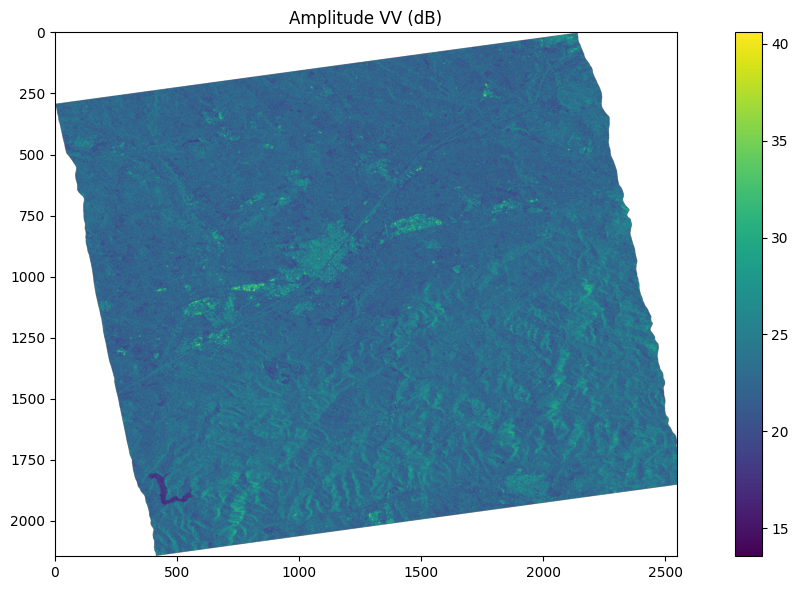

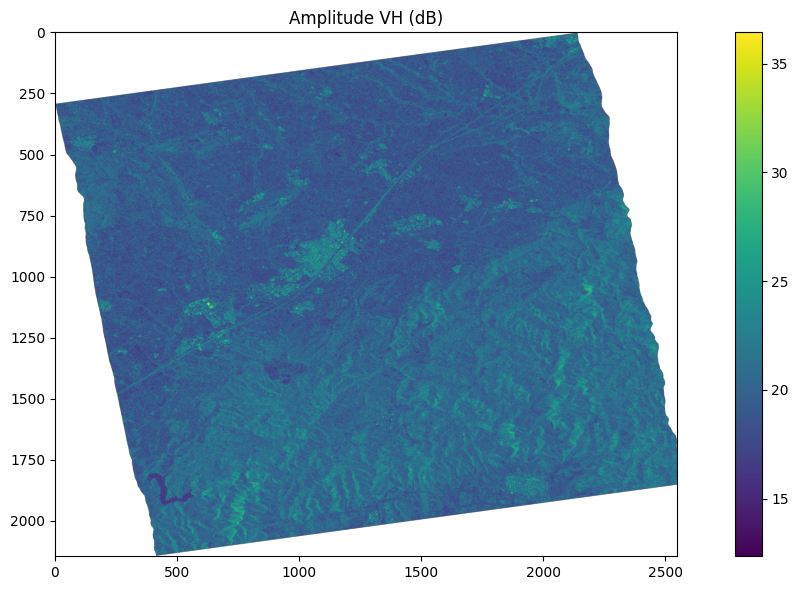

In [22]:
# Plot amplitudes in VV and VH in dB

plot_data(10*np.log10(S1_20230418.data.Amplitude_VV), 'Amplitude VV (dB)', True)
plot_data(10*np.log10(S1_20230418.data.Amplitude_VH), 'Amplitude VH (dB)', True)

We can also extract the latitude and longitude layer as we must store it on the stack later.

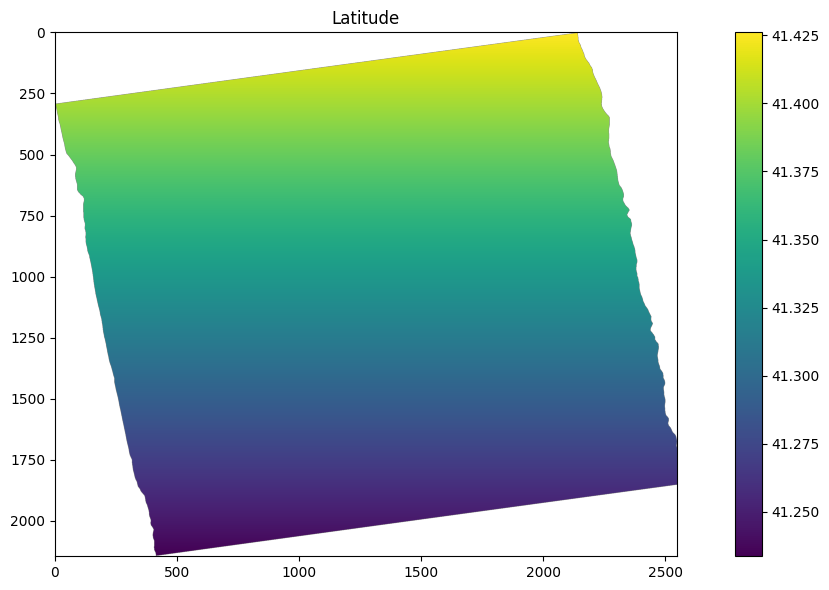

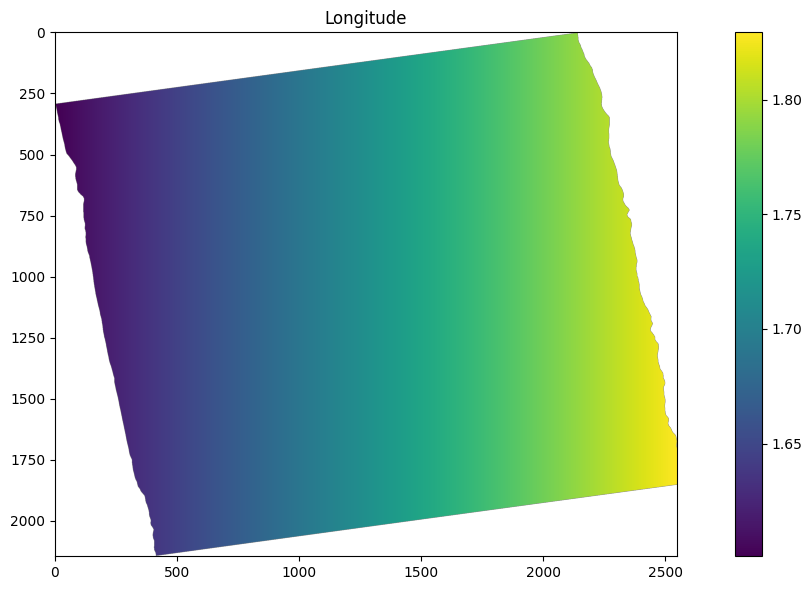

In [27]:
# TODO - Extract the latitude and longitude data from one of the S1 acquisitions
latitude_data = S1_20230418.data.latitude.values
longitude_data = S1_20230418.data.longitude.values

plot_data(latitude_data, 'Latitude', True)
plot_data(longitude_data, 'Longitude', True)

We can also generate a false-color RGB image from these SAR images by assigning the amplitude channels `(VV, VH, VV / VH)` to the RGB channels, respectively.
For this we need to generate an array with a shape `(rows, cols, 3)`, where the last 3 channels correspond to the RGB.
We can use [`np.dstack`](https://numpy.org/doc/stable/reference/generated/numpy.dstack.html) for this.

In this case, the RGB image will be normalized between 0 and 2.5 times the mean amplitude for each channel.


---



## 3. Loading the Land Cover data.

The last data to be loaded is the land cover. In this case we are working with a Tiff file. Therefore we will use rasterio to charge the data.

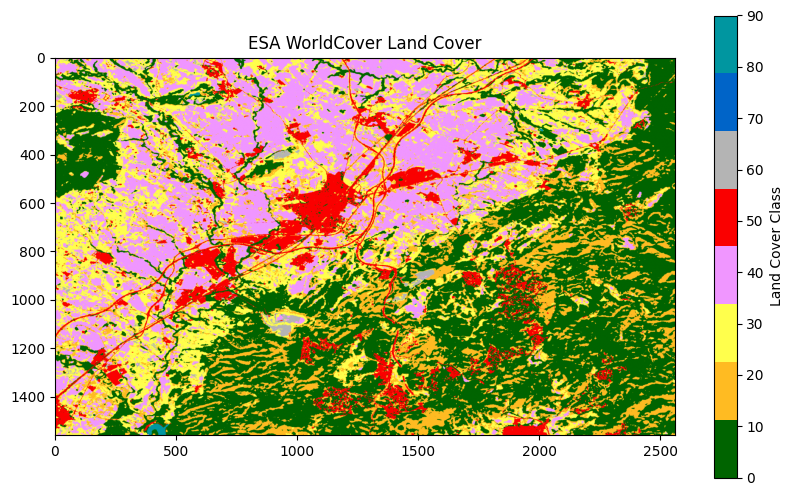

In [35]:
land_cover_penedes = LandCover(os.path.join(RAW_DATA_FOLDER, "Land_Cover_Pendes.tif"))
land_cover_penedes.plot()